In [78]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [79]:
import pandas as pd
import os
import re
from ast import literal_eval
import numpy as np

pd.set_option('display.max_rows', 250)
pd.set_option('display.max_colwidth', 500)

In [80]:
from heuristics.model.utils import plot_imgs_with_labels, load_images
from heuristics.heuristics import catalog_flag, calculate_text_heuristics

In [81]:
HEUR_IMG_DIR = 'data/heuristics_images/'

In [82]:
dress_room_df = pd.read_csv('heuristics/data/heuristics_detskaya.csv')

In [83]:
dress_room_df.columns

Index(['image_id_ext', 'item_id_ext', 'microcat_name', 'title', 'description',
       'crop_coords', 'crop_area', 'is_catalog', 'n_texts', 'person_found',
       'perform_top_microcat_value', 'perform_top_microcat_name',
       'perform_top_microcat_prob', 'perform_top_other_classes_value',
       'perform_top_other_classes_prob', 'image'],
      dtype='object')

### Основные поля
'image_id_ext' - id изображения,

'item_id_ext' - id объявления к которому относится изображение,

'title' - заголовок объявления,

'description' - описание объявления,

'microcat_name' - категория объявления,

'image' - сслыка на изображение

### Выходы модели Smart-crop
'crop_coords' - координаты кропа,

'crop_area' - площадь кропа,

'is_catalog' - является ли изображение каталожным,

### Выход модели text_detector
'n_texts' - кол-во областей с текстом на изображении,

### Выход модели по поиску лиц
'person_found' - есть ли человек на изображении

### Выход модели Perform
'perform_top_microcat_value' - предсказание id микрокатегории изображения в виде

'perform_top_microcat_name' - соответствующее название микрокатегории

'perform_top_microcat_prob' - вероятность предсказанной микрокатегории

'perform_top_other_classes_value' - предсказание на другую группу классов

'perform_top_other_classes_prob' - вероятность предсказания

In [84]:
dress_room_df.head(2)[['microcat_name', 'image', 'title', 'description']]

,microcat_name,image,title,description
0,Спальные гарнитуры,http://labelimages.avito.ru/15986849237.jpg,Спальня Мартина,"Спальня Мартина\n \nВажное отличие - мебель вся в наличии!\n \nГарантия лучшей цены!\n \nОплата при получении!\n \nДоставляем до адреса в любой населённый пункт!\n \nДополнительно подъем, сборка!\n \nГарантия на мебель 3 года!\n \nМебель из спального гарнитура “Мартина” станет отличным и современным дополнением любого интерьера.\n \nЦвет: белый/сонома; белый/венге\n \nМатериал: ЛДСП\n \nЦена указана за комплект. В комплект входит:\n \nМАРТИНА КРОВАТЬ 1635х800х2037 (ШхВхГ) 1,6М = 7300 руб\n \..."
1,Спальные гарнитуры,http://labelimages.avito.ru/15979254876.jpg,Спальная мебель бу,Спальная мебель б/у


In [85]:
# %%time
# если не тут не скачивается, то лучше взять картинки с гугл диска
# image_paths = load_images(dress_room_df['image'], HEUR_IMG_DIR)

In [86]:
dress_room_df['img_path'] = dress_room_df['image_id_ext'].map(
    lambda x: os.path.join(HEUR_IMG_DIR, f'{int(x)}.jpg')
)

## Смотрим на данные

In [87]:
dress_room_df['microcat_name'].value_counts()

Кровати               7785
Спальные гарнитуры    6954
Name: microcat_name, dtype: int64

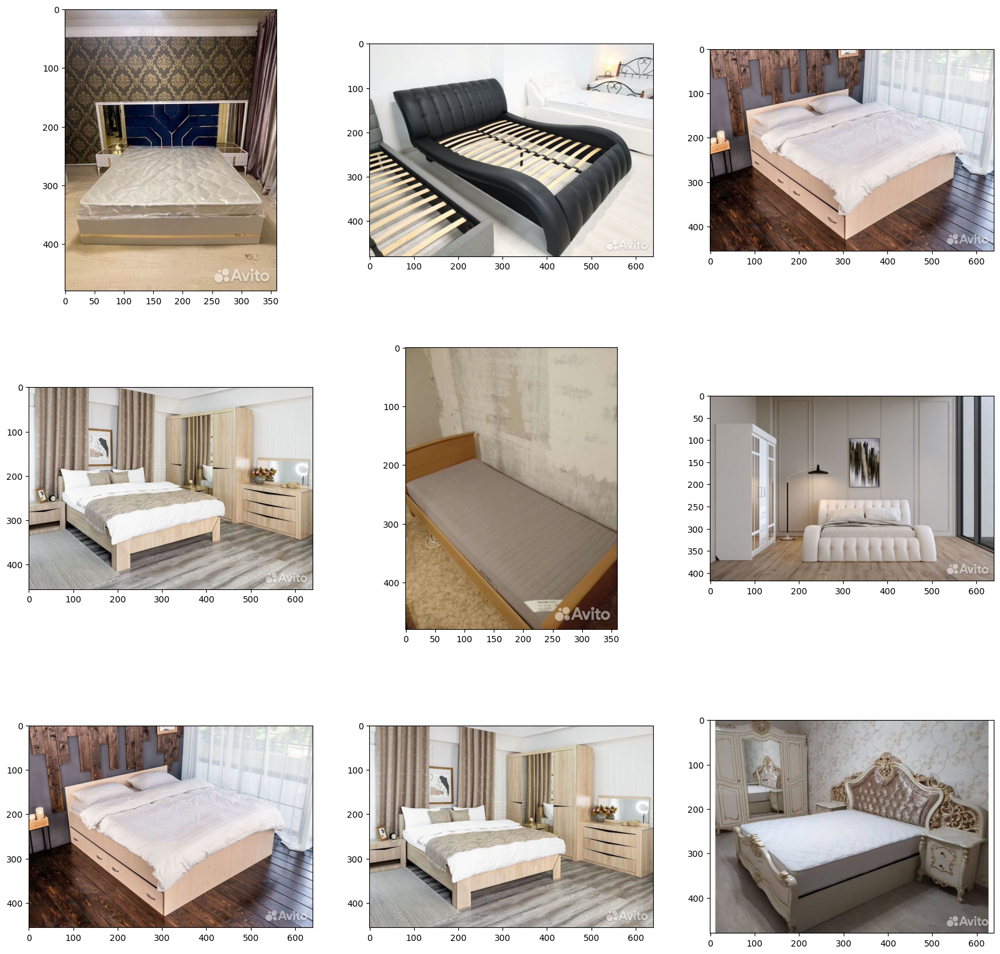

In [88]:
sample_df = dress_room_df.sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [89]:
sample_df[['title', 'description']]

,title,description
0,Новый - Спальный Гарнитур «Амелия»,💎Спальный Гарнитур •Амелия • 6-ти дверная🔥 В 💯 % Турецком • Стиле 🇹🇷 \n\n📍Производство: г.Ставрополь\n\nОписание и Размеры 📐\nШкаф 6дв:Шир: 2.60см/Г50см/Выс2.10см\nКровать: 180/200см\nТумба прикроватная: \nШ50см/Г40см/В45см\nТуалетный стол: Ш150см/Г45см/В80см.без пуфика!!!\nЗеркало: 100/100см\n☑️Корпус: ЛДСП\n☑️Фасад: МДФ крашенный\n\nПетли с Доводчиками❗️\n\nВ Подарок 🎁 Пуфик!\nВ Подарок 🎁 Матрас!\nВ Наличии!!!
1,Кровать 140х200 черная Мадрид,"Кровать 140х200 черная Мадрид\n \nБЫСТРАЯ ДОСТАВКА ДО ПОДЪЕЗДА! РАССРОЧКА!\n \n*\n \n✅ ОПЛАТА ПРИ ПОЛУЧЕНИИ, БЕЗ ПРЕДОПЛАТ, ПОСЛЕ ОСМОТРА!\n \n✅ Собственное производство! Гарантия!\n \n✅ Рассрочка: СБЕРБАНК, Тинькофф!\n \n✅ Возможна оплата долями без % (4 платежа каждые 2 недели)\n \n*\n \nКРОВАТЬ ""МАДРИД"", цвет черный\n \nМатериал: экокожа 4 кат. (30% натуральная кожа)\n \nВысота изголовье: 90 см,\n \nСпальное место 140*200 см,\n \nГабариты 185*260 см.\n \nОснование в комплекте: железное ор..."
2,Кровать с матрасом и с ящиками 140 200 Милена,"Кровать с матрасом и с ящиками 140 200 Милена\n \nДОСТАВКА ДО ПОДЪЕЗДА!\n \n*\n \n✅ ОПЛАТА ПРИ ПОЛУЧЕНИИ, БЕЗ ПРЕДОПЛАТ, ПОСЛЕ ОСМОТРА!\n \n✅ Собственное производство! Гарантия!\n \n✅ Рассрочка: СБЕРБАНК, Тинькофф!\n \n✅ Возможна оплата долями без % (4 платежа каждые 2 недели)\n \n*\n \nКровать двуспальная ""МИЛЕНА С ЯЩИКАМИ""\n \nМатрас ""Lite"" в комплекте, беспружинный, 10 см\n \nМатериал: ЛДСП,\n \nИзголовье: 80 см.,\n \nГабариты кровати: 145*205 см.,\n \nСпальное место: 140*200,\n \nЯщик дл..."
3,Спальный гарнитур с матрасом Саманта,"Спальный гарнитур с матрасом Саманта\n \nБЕСПЛАТНАЯ ДОСТАВКА ОТ 35 000р.\n \n*\n \n✅ ОПЛАТА ПРИ ПОЛУЧЕНИИ, БЕЗ ПРЕДОПЛАТ, ПОСЛЕ ОСМОТРА!\n \n✅ Собственное производство! В наличии!\n \n✅ Рассрочка: СБЕРБАНК, Тинькофф!\n \n✅ Возможна оплата долями без % (4 платежа каждые 2 недели)\n \n*\n \nСПАЛЬНЫЙ ГАРНИТУР ""САМАНТА""\n \nМатрас ""Lite"" в комплекте, беспружинный, 10 см\n \n- Кровать двуспальная: ШхДхВ 1674х2152х876 мм\n \n- Шкаф 4-х створчатый с зеркалом: ШхВхГ 1956х2200х545 мм\n \n- Комод с ящ..."
4,Кровать с матрасом,В хорошем состоянии. Характеристики в описании. Самовывоз. Самовынос.
5,Спальный гарнитур Волна с матрасом в комплекте,"Спальный гарнитур Волна с матрасом в комплекте\n \nБЕСПЛАТНАЯ ДОСТАВКА ОТ 35 000р.\n \n*\n \n✅ ОПЛАТА ПРИ ПОЛУЧЕНИИ, БЕЗ ПРЕДОПЛАТ, ПОСЛЕ ОСМОТРА!\n \n✅ Собственное производство! В наличии!\n \n✅ Рассрочка: СБЕРБАНК, Тинькофф!\n \n✅ Возможна оплата долями без % (4 платежа каждые 2 недели)\n \n*\n \nСПАЛЬНЫЙ ГАРНИТУР ""ВОЛНА""\n \nМатрас ""Lite"" в комплекте, беспружинный, 10 см\n \nКровать двуспальная 205*260 см.\n \nГабариты спального места: 160*200 см.\n \nШкаф купе с зеркалом и встроенным ком..."
6,Кровать с матрасом и с ящиками 140 200 Милена,"Кровать с матрасом и с ящиками 140 200 Милена\n \nДОСТАВКА ДО ПОДЪЕЗДА!\n \n*\n \n✅ ОПЛАТА ПРИ ПОЛУЧЕНИИ, БЕЗ ПРЕДОПЛАТ, ПОСЛЕ ОСМОТРА!\n \n✅ Собственное производство! Гарантия!\n \n✅ Рассрочка: СБЕРБАНК, Тинькофф!\n \n✅ Возможна оплата долями без % (4 платежа каждые 2 недели)\n \n*\n \nКровать двуспальная ""МИЛЕНА С ЯЩИКАМИ""\n \nМатрас ""Lite"" в комплекте, беспружинный, 10 см\n \nМатериал: ЛДСП,\n \nИзголовье: 80 см.,\n \nГабариты кровати: 145*205 см.,\n \nСпальное место: 140*200,\n \nЯщик дл..."
7,Спальный гарнитур с матрасом Саманта,"Спальный гарнитур с матрасом Саманта\n \nБЕСПЛАТНАЯ ДОСТАВКА ОТ 35 000р.\n \n*\n \n✅ ОПЛАТА ПРИ ПОЛУЧЕНИИ, БЕЗ ПРЕДОПЛАТ, ПОСЛЕ ОСМОТРА!\n \n✅ Собственное производство! В наличии!\n \n✅ Рассрочка: СБЕРБАНК, Тинькофф!\n \n✅ Возможна оплата долями без % (4 платежа каждые 2 недели)\n \n*\n \nСПАЛЬНЫЙ ГАРНИТУР ""САМАНТА""\n \nМатрас ""Lite"" в комплекте, беспружинный, 10 см\n \n- Кровать двуспальная: ШхДхВ 1674х2152х876 мм\n \n- Шкаф 4-х створчатый с зеркалом: ШхВхГ 1956х2200х545 мм\n \n- Комод с ящ..."
8,Спальня Джоконда,"Спальня Джоконда\n \nГарантия лучшей цены!\n \nОплата при получении!\n \nРассрочка без банка!\n \nВажное отличие - мебель вся в 

## Регулярки

In [90]:
regexp1 = re.compile(r'.')
regexp1 = re.compile(r'детск')
include_re = [regexp1]

not_regexp1 = re.compile(r'заказ')
not_regexp2 = re.compile(r'доставк')
not_regexp3 = re.compile(r'производител')
not_regexp4 = re.compile(r'новинка')
not_regexp5 = re.compile(r'на рынке')
#not_regexp6 = re.compile(r'гарнитур')
not_regexp7 = re.compile(r'гресс')
#not_regexp6 = re.compile(r'для администратор')
exclude_re = [not_regexp1, not_regexp2, not_regexp3, not_regexp4, not_regexp5, not_regexp7]

In [93]:
dress_room_df = calculate_text_heuristics(dress_room_df, include_re, exclude_re=exclude_re)

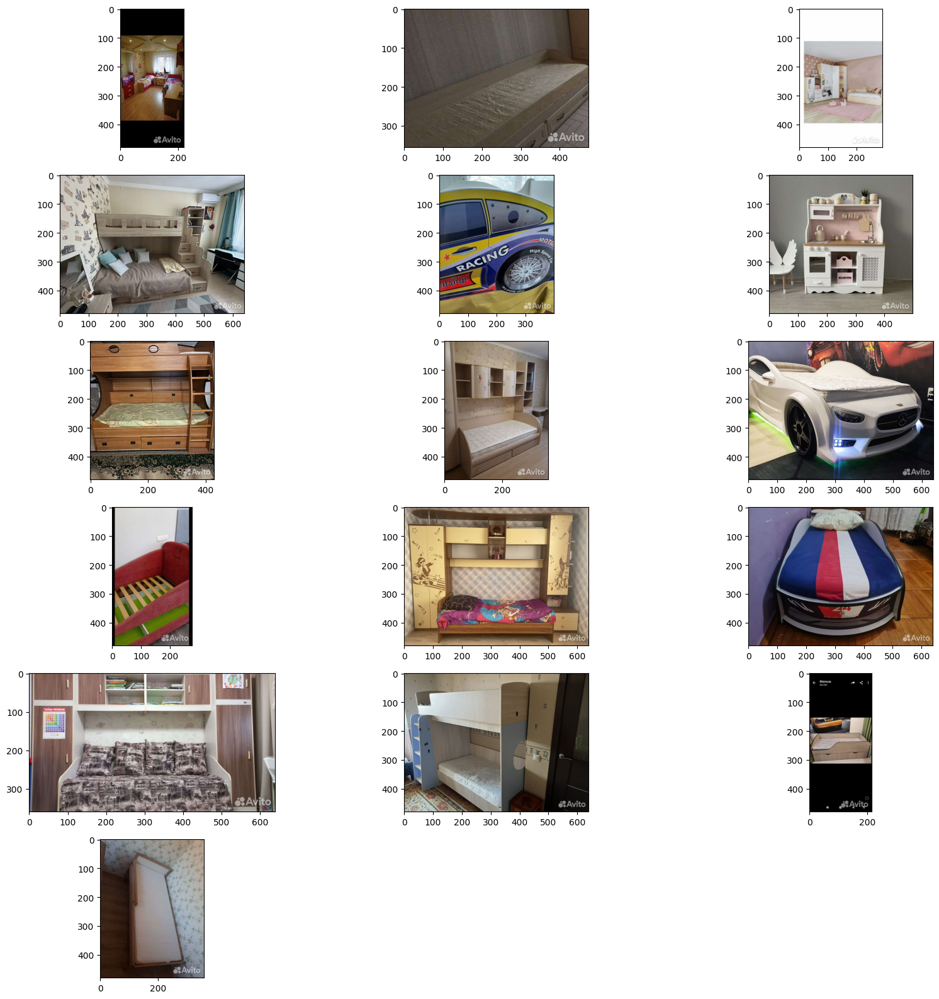

In [94]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].sample(16).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

In [96]:
sample_df[['title', 'description']]

,title,description
0,Детский спальный гарнитур,"Продаётся детский спальный гарнитур, в хорошем состоянии."
1,Детская кровать,"Отдам за символическую плату, кровать погрызана щенком. Самовывоз."
2,"Детский спальный гарнитур,детская комната","Детский спальный гарнитур(как новый) \nСостояние ИДЕАЛЬНОЕ!!! \nПродаю всё вместе, комплектом! \nКровать продаётся с матрасом!!!\nТОРГ!!!"
3,Детская мебель бу,"Продается комплект детской мебели, для двух деток. Двухъярусная кровать с лестницей, книжный шкаф, шкаф для одежды и одна тумбочка . Все размеры смотрите в разделе фотографий . Кровати продаются с матрасами."
4,Детская кровать от 3 лет бу,"Кровать-машинка детская. Габариты 175см х 84см, спальное место 170х80. Без матраса. В отличном состоянии. По характеристикам выдерживает вес до 70кг. Аккуратно выполнена, никаких острых углов. В подарок две светодиодные фары."
5,Детская кровать,"Это Фабрика хорошего настроения!🙂 Мы находимся в г. Хабаровске и являемся компанией по изготовлению мягкой и корпусной мебели (диваны, кровати, шкафы, кухни и др.🛋️),наш адрес Тихоокеанская 81"
6,"Продам детскую двухъярусную кровать,в. Цена 20т","Двухъярусная кровать , в хорошем состоянии, с двумя матрасами. Цена 25 т"
7,Мебель в детскую,Продам мебель фабрики Лером. Цвет Дуб Беленный.Шкаф для одежды ш45×г62×в217- 2 штуки. Шкаф для книг ш45×г36×в217. Кровать с ортопедическим основанием дл195×гл95×в64. Антресоль ш200×гл36×в66. Стол ш98×гл51-60×в78. Мебельный декор можно убрать без следа. Матрас Орматек Kids Comfort 190×90×12 двухсторонний с разной степенью жесткости можно приобрести по желанию цена 7500. Все в очень хорошем состоянии.
8,Детская кровать машина с подсветкой,Кровать+Матрас \nПродажа без торга
9,Детская кровать с матрасом,"Детская кровать ""Тэдди"" в отличном состоянии с огромным выдвижным ящиком снизу. В подарок матрас и чехол на него (всё чистое). Подходит как для девочки, так и для мальчика. Продаем, т.к. ребёнок вырос. Самовывоз. Цена окончательная, без торга."


# Внешние данные - модели

## 1. Perform

In [97]:
dress_room_df[['image', 'perform_top_microcat_name', 'perform_top_microcat_prob', 
               'perform_top_other_classes_value', 'perform_top_other_classes_prob']]

,image,perform_top_microcat_name,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob
0,http://labelimages.avito.ru/15986849237.jpg,"Кровати, диваны и кресла",0.246469,Скриншоты переписок,0.031009
1,http://labelimages.avito.ru/15979254876.jpg,"Кровати, диваны и кресла",0.765472,Комната,0.845141
2,http://labelimages.avito.ru/16001041449.jpg,"Кровати, диваны и кресла",0.836585,Скриншоты переписок,0.010549
3,http://labelimages.avito.ru/15941608501.jpg,"Кровати, диваны и кресла",0.907106,Алкоголь,0.010479
4,http://labelimages.avito.ru/15955640067.jpg,"Кровати, диваны и кресла",0.506734,Планировка квартиры,0.018787
...,...,...,...,...,...
14734,http://labelimages.avito.ru/16052280771.jpg,Игрушки,0.408749,Дети,0.058393
14735,http://labelimages.avito.ru/15798071108.jpg,Игрушки,0.565875,Скриншоты переписок,0.005426
14736,http://labelimages.avito.ru/16051509906.jpg,Салон,0.242166,Планировка,0.392039
14737,http://labelimages.avito.ru/16053061703.jpg,Меконгский бобтейл,0.236940,Дети,0.034452


In [98]:
dress_room_df['perform_top_microcat_name'].value_counts()[:10]

Кровати, диваны и кресла    13605
Окна и балконы                858
Путешествия                    53
Для ресторана                  32
Другое                         30
Для магазина                   26
Багажники и фаркопы            13
Бумага                         11
Двери                          10
Туризм                          7
Name: perform_top_microcat_name, dtype: int64

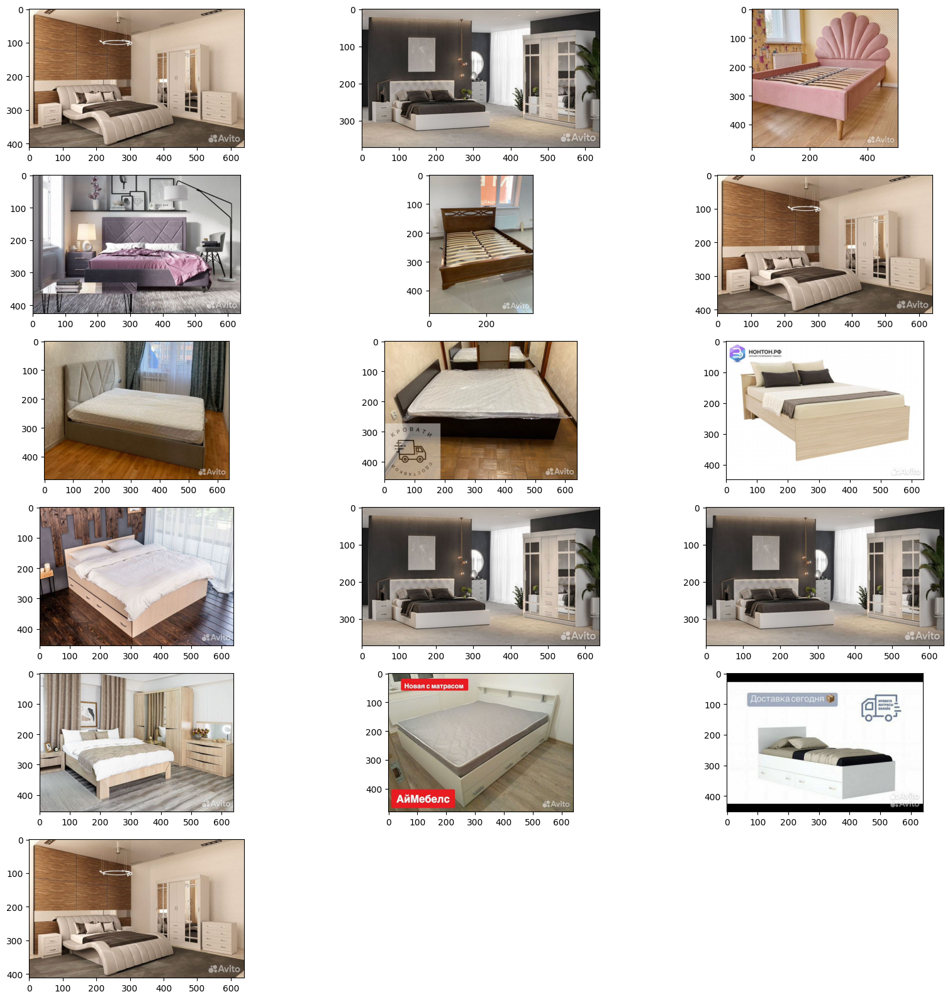

In [99]:
sample_df = dress_room_df[(dress_room_df['perform_top_microcat_name'] == 'Кровати, диваны и кресла') & (
    dress_room_df['perform_top_microcat_prob'] >= 0.1)].sample(16).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 2. Text detector 
Определяет область с текстом на картинке

Мы будем просто считать кол-во таких областей

In [104]:
dress_room_df['n_texts'].value_counts()

1     7400
0     5496
2      464
5      431
4      358
3      334
6       63
7       39
8       32
24      26
10      23
9       18
20      10
12      10
17       6
11       6
16       4
13       4
14       3
21       2
18       2
23       2
39       2
32       1
19       1
34       1
36       1
Name: n_texts, dtype: int64

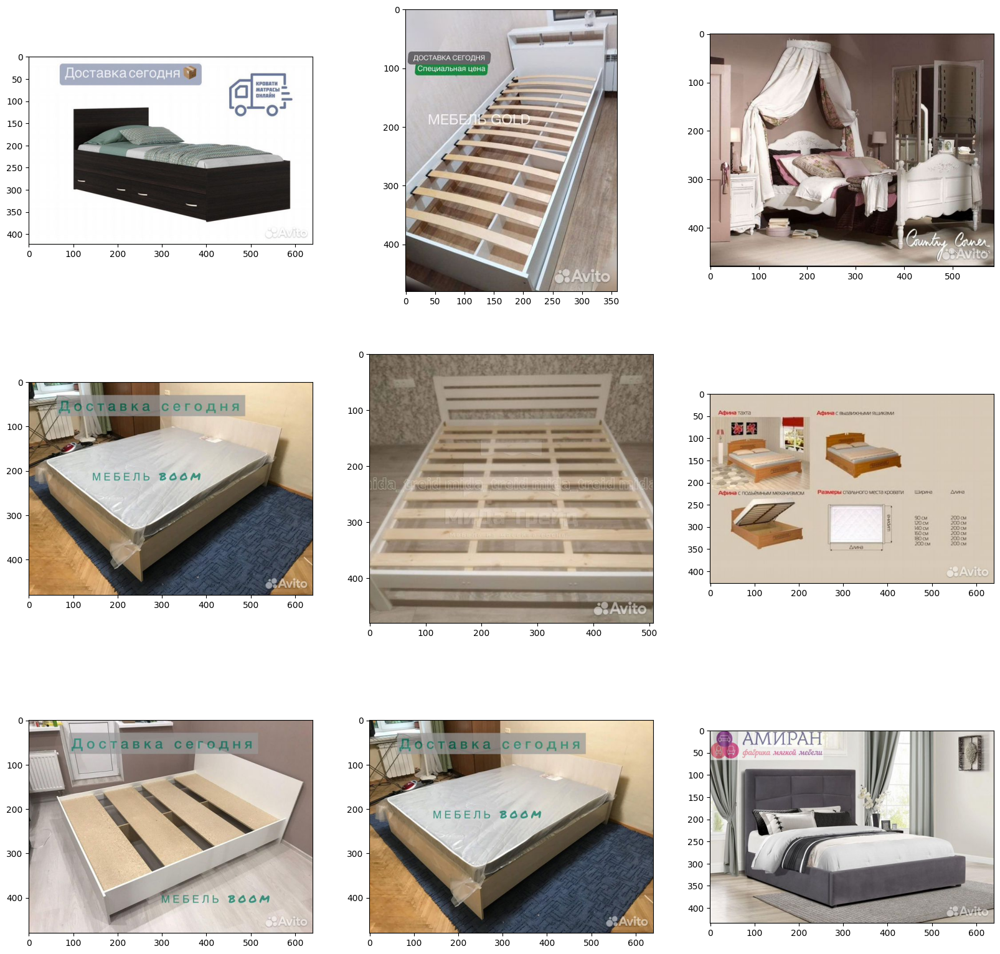

In [103]:
sample_df = dress_room_df[dress_room_df['n_texts'] >= 3].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## 3. Smart crop

In [105]:
dress_room_df[['crop_coords', 'crop_area', 'is_catalog']]

,crop_coords,crop_area,is_catalog
0,"[0.2204589694738388, 0.1370442658662796, 0.9575194716453552, 0.9179686903953552]",0.575589,False
1,"[0.191650390625, 0.2275390625, 0.951171875, 0.9427083134651184]",0.543186,False
2,"[0.066162109375, 0.07451396435499191, 0.79443359375, 0.9184008836746216]",0.614579,False
3,"[0.06585693359375, 0.15848475694656372, 0.93798828125, 0.9142731428146362]",0.659147,True
4,"[0.0185546875, 0.08669354766607285, 0.97412109375, 0.9124664068222046]",0.789081,False
...,...,...,...
14734,"[0.1239013671875, 0.0798611119389534, 0.8359375, 0.9427083134651184]",0.614378,False
14735,"[0.217041015625, 0.10143089294433594, 0.82177734375, 0.8731272220611572]",0.466673,NaN
14736,"[0.0222981758415699, 0.2158203125, 0.966796875, 0.86181640625]",0.610142,False
14737,"[0.1490478515625, 0.3522135317325592, 0.86376953125, 0.833984375]",0.344332,False


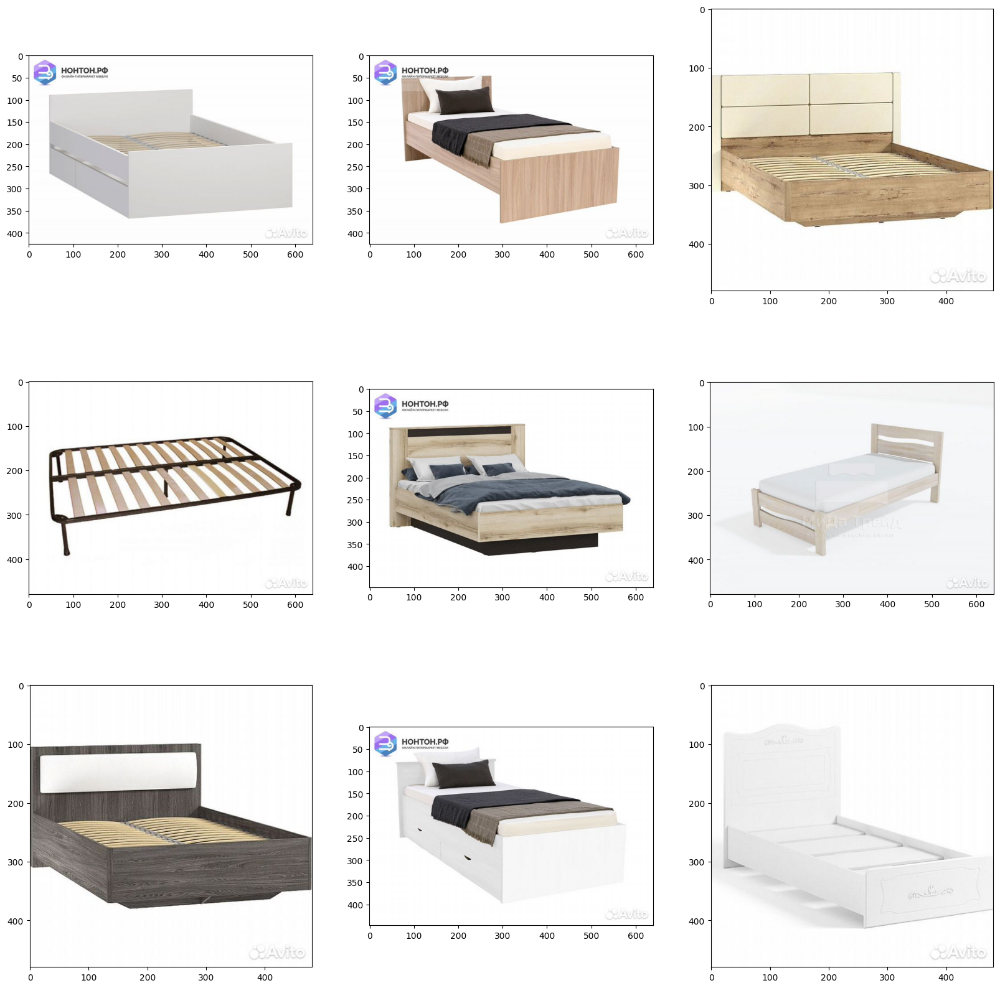

In [106]:
sample_df = dress_room_df[dress_room_df['is_catalog'] == True].sample(9).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

## Модель распознавания лиц

In [107]:
sample_df = dress_room_df[dress_room_df['person_found'] == True].sample(16).reset_index()
plot_imgs_with_labels(sample_df['img_path'])

ValueError: Cannot take a larger sample than population when 'replace=False'

In [108]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1)].shape

(70, 19)

In [109]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)].shape

(66, 19)

In [110]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        ) & (dress_room_df['person_found'] == False)].shape

(66, 19)

In [111]:
dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False)
             ].to_csv('new_data/heur_detskaya.csv', index=False)

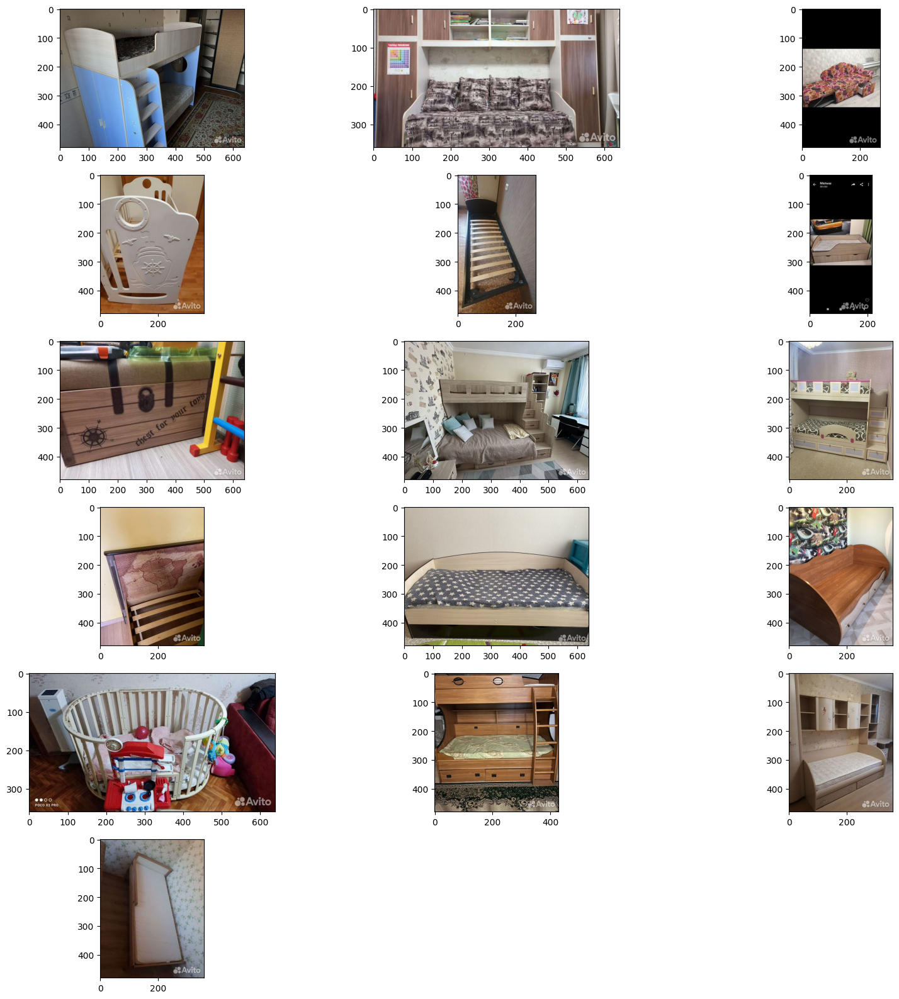

In [112]:
sample_df = dress_room_df[(dress_room_df['description_match'] == 1) & (
    dress_room_df['title_match'] == 1) & (dress_room_df['is_catalog'] == False
                                        )].sample(16).reset_index()

plot_imgs_with_labels(sample_df['img_path'])

In [113]:
sample_df

,index,image_id_ext,item_id_ext,microcat_name,title,description,crop_coords,crop_area,is_catalog,n_texts,person_found,perform_top_microcat_value,perform_top_microcat_name,perform_top_microcat_prob,perform_top_other_classes_value,perform_top_other_classes_prob,image,img_path,title_match,description_match
0,10398,16047096285,2678406025,Спальные гарнитуры,Детская двухъярусная кровать бу,"Детская, двухъярусная, двухспальная кровать, с матрасами 2 шт, б/у. С торца есть шкаф для вещей с вешалками. Лесенка требует ремонта.\n Самовывоз с разбором в г. Пушкино","[0.023284912109375, 0.0821940079331398, 0.81396484375, 0.9654948115348816]",0.698408,False,1,False,237,"Кровати, диваны и кресла",0.572670,Скриншоты переписок,0.025260,http://labelimages.avito.ru/16047096285.jpg,data/heuristics_images/16047096285.jpg,1,1
1,5460,16043958682,2657687901,Спальные гарнитуры,"Детский спальный гарнитур ""Паскаль""","Спальный гарнитур для двоих детей,с выдвижной кроватью. Состояние хорошее. С матрацами. Длина спального места 180см. Общая длинна гарнитура 247см. Высота шкафов 210см.","[0.08843994140625, 0.0620659738779068, 0.900390625, 0.9852430820465088]",0.749574,False,0,False,237,"Кровати, диваны и кресла",0.725286,Комната,0.116529,http://labelimages.avito.ru/16043958682.jpg,data/heuristics_images/16043958682.jpg,1,1
2,10957,16045860376,2664363130,Кровати,Кровати и диваны детские бу,"Продам два детских дивана,один для мальчика и один для девочки.состояние хорошие.цена за каждый диван по 3000 рублей.","[0.008680555038154125, 0.39111328125, 0.9427083134651184, 0.67626953125]",0.266344,False,1,False,237,"Кровати, диваны и кресла",0.953001,Комната,0.646523,http://labelimages.avito.ru/16045860376.jpg,data/heuristics_images/16045860376.jpg,1,1
3,14682,16048310139,2680699888,Кровати,Детская кроватка,Состояния отличное\nМатраса нет \nРазмеры на фото \nК ней есть еще комод ( смотрите в профиле ),"[0.0379231758415699, 0.103515625, 0.9602864384651184, 0.94580078125]",0.776893,False,1,False,3766,Очистители воздуха,0.785368,Скриншоты переписок,0.005147,http://labelimages.avito.ru/16048310139.jpg,data/heuristics_images/16048310139.jpg,1,1
4,9648,16045173764,2649013497,Кровати,Детская кровать без матраса 80*190,Каркас с ортопедическим основанием. Без матраса.,"[0.0353732630610466, 0.13134765625, 0.9140625, 0.953125]",0.722087,False,1,False,237,"Кровати, диваны и кресла",0.997705,Дети,0.007936,http://labelimages.avito.ru/16045173764.jpg,data/heuristics_images/16045173764.jpg,1,1
5,9727,16045185978,2602937720,Кровати,Продам детскую кровать в отличном состоянии,Кровать детская с поддержкой. В отличном состоянии.,"[0.0024956597480922937, 0.428955078125, 0.9709200859069824, 0.62255859375]",0.187490,False,2,False,237,"Кровати, диваны и кресла",0.942215,Дети,0.003823,http://labelimages.avito.ru/16045185978.jpg,data/heuristics_images/16045185978.jpg,1,1
6,14619,16032218867,2657183296,Спальные гарнитуры,Продаётся комплект детской мебели,Комплект детской мебели.\nСостояние безупречное. Торг уместен. Ковёр в подарок!,"[0.01064300537109375, 0.0935872420668602, 0.896484375, 0.8919270634651184]",0.707202,False,5,False,280,Товары для школы,0.119152,Алкоголь,0.071053,http://labelimages.avito.ru/16032218867.jpg,data/heuristics_images/16032218867.jpg,1,1
7,10063,16062732222,2655247477,Спальные гарнитуры,Детская мебель бу,"Продается комплект детской мебели, для двух деток. Двухъярусная кровать с лестницей, книжный шкаф, шкаф для одежды и одна тумбочка . Все размеры смотрите в разделе фотографий . Кровати продаются с матрасами.","[0.141357421875, 0.1705729216337204, 0.85302734375, 0.8697916865348816]",0.497613,False,0,False,237,"Кровати, диваны и кресла",0.520955,Скриншоты переписок,0.065532,http://labelimages.avito.ru/16062732222.jpg,data/heuristics_images/16062732222.jpg,1,1
8,3698,16004799937,2669335113,Спальные гарнитуры,Детский спальный гарнитур бу,"Продам детский спальный гарнитур в идеальном состоянии, двухъярусная кровать при желании разделяется на две отдельно стоящие кровати